# Forecasting the Weather Using Facebook's Prophet Algorithm

## Project Overview

In this project, we'll predict the weather using the Facebook Prophet algorithm and local weather data of New York City. Prophet uses an additive model to add up seasonal effects and trends to make a prediction.  The advantage of prophet is that it automatically identifies seasonality in the data - and weather data has strong seasonal effects.  So without any feature engineering, we can get good baseline accuracy.  It can also scale to multiple time series (think data from adjacent weather stations) easily.

By the end, we'll have a model that predicts the weather, and can be extended to improve accuracy.

**Project Steps**
* Load in and clean data
* Define targets and predictors
* Train model
* Scale model to entire dataset using cv
* Make future predictions

In [11]:
import pandas as pd
import prophet
import numpy as np
import plotly

## Load and Clean the Data

In [12]:
weather = pd.read_csv("weather.csv", index_col="DATE")

In [13]:
weather

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV01,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",90.0,100.0,NaN,NaN,NaN,0.05,0.4,0.0,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,14.76,NaN,NaN,0.09,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,12.97,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,11.18,NaN,NaN,0.43,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We can see that some of these columns have missing data because maybe the sensor didn't work all the time properly or they didn't record data correctly. We have to fix that as machine learning models can't work with missing values. What we'll do here is to get rid of the columns that have a ton of missing values. To do that we're going to find the percentage of null values in each column and drop those that have more than 5% of null values 

In [14]:
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]

In [15]:
null_pct

STATION    0.000000
NAME       0.000000
ACMH       0.502175
ACSH       0.502149
AWND       0.264834
FMTM       0.475769
PGTM       0.349643
PRCP       0.000000
SNOW       0.000000
SNWD       0.000026
TAVG       0.679455
TMAX       0.000000
TMIN       0.000000
TSUN       0.997774
WDF1       0.599177
WDF2       0.497929
WDF5       0.500337
WDFG       0.659910
WDFM       0.903101
WESD       0.683882
WSF1       0.599073
WSF2       0.497929
WSF5       0.500362
WSFG       0.599151
WSFM       0.903101
WT01       0.656208
WT02       0.952211
WT03       0.931811
WT04       0.982267
WT05       0.981257
WT06       0.990525
WT07       0.994641
WT08       0.776043
WT09       0.994305
WT11       0.999146
WT13       0.893290
WT14       0.955576
WT15       0.997825
WT16       0.664104
WT17       0.996971
WT18       0.937610
WT19       0.999741
WT21       0.999819
WT22       0.997437
WV01       0.999974
WV20       0.999974
dtype: float64

In [16]:
valid_columns = weather.columns[null_pct < .05]

In [59]:
print("Columns to keep")
valid_columns

Columns to keep


Index(['STATION', 'NAME', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'TMIN'], dtype='object')

The next thing we're going to do is to subset our data using only our valid columns

In [18]:
weather = weather[valid_columns].copy()

In [60]:
weather.columns = weather.columns.str.lower() # Turning all the columns to lowercase to save time holding shift

As we are dealing with time series data we're going to make sure that our data type for indexes is date to make it easier to work with later on.

In [20]:
weather.index = pd.to_datetime(weather.index)

## Split the Data

We're going to split the dataframe up into two. One that has data for JFK Airport and one that has data for Lagardia Airport and cmbine them so they fit together and add extra columns to each row. So each row is going to have a unique date and data from each station will show up in a single row. 

In [21]:
weather["station"].unique()

array(['USW00014732', 'USW00094789'], dtype=object)

In [22]:
lga = weather[weather["station"] == "USW00014732"].copy()

In [23]:
lga

,station,name,prcp,snow,snwd,tmax,tmin
DATE,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


In [24]:
weather = weather[weather["station"] == "USW00094789"].copy()

In [25]:
weather

,station,name,prcp,snow,snwd,tmax,tmin
DATE,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33


In [26]:
weather = weather.merge(lga, left_index=True, right_index=True)

In [27]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y
DATE,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


## Set up for the algorithm

Now we're ready to do the set up for our Prophet algorithm. What we're going to do here is to set up the `target` which is the thing we're trying to predict i.e. the future temperature at JFK Airport

In [61]:
weather['y'] = weather.shift(-1)["tmax_x"] # Take the maximum daily temperature at JFK Airport and shift it back one day

In [29]:
weather[["tmax_x", "y"]]

,tmax_x,y
DATE,,
1970-01-01,28,31.0
1970-01-02,31,38.0
1970-01-03,38,31.0
1970-01-04,31,35.0
1970-01-05,35,36.0
...,...,...
2022-11-13,61,47.0
2022-11-14,47,46.0
2022-11-15,46,53.0


The dataframe above means we can use today's max temperature to help us predict tomorrow's max temperature. So `y` represents tomorrow's max temperature.

To fill the null values we're going to usse the ffill() method (forward fill) which takes the last non null value in a column to fill in the next null value. It doesn't make total sense to fill  in `NaN` values with yesterday temperature but it makes it easier to forecast the future and it's not going to mess up our predictions.

In [30]:
weather = weather.ffill()

In [31]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y
DATE,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0


In [62]:
weather["ds"] = weather.index  # Prophet needs the index to be called ds

In [33]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y,y,ds
DATE,,,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21,31.0,1970-01-01
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19,38.0,1970-01-02
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26,31.0,1970-01-03
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22,35.0,1970-01-04
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21,36.0,1970-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43,47.0,2022-11-13
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38,46.0,2022-11-14
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36,53.0,2022-11-15


In [34]:
weather.columns

Index(['station_x', 'name_x', 'prcp_x', 'snow_x', 'snwd_x', 'tmax_x', 'tmin_x',
       'station_y', 'name_y', 'prcp_y', 'snow_y', 'snwd_y', 'tmax_y', 'tmin_y',
       'y', 'ds'],
      dtype='object')

In [63]:
predictors = weather.columns[~weather.columns.isin(["y", "name_x", "station_x", "name_y", "station_y", "ds"])] # the '~' operator stands for exclude

In [36]:
predictors

Index(['prcp_x', 'snow_x', 'snwd_x', 'tmax_x', 'tmin_x', 'prcp_y', 'snow_y',
       'snwd_y', 'tmax_y', 'tmin_y'],
      dtype='object')

In [37]:
train = weather[:"2021-12-31"] 
test = weather["2021-12-31":]

## Run Prophet for 2022

In [38]:
from prophet import Prophet

In [39]:
def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)
    

17:39:04 - cmdstanpy - INFO - Chain [1] start processing
17:39:29 - cmdstanpy - INFO - Chain [1] done processing


In [40]:
predictions = m.predict(test)

In [41]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,61.451789,43.770868,58.958793,61.451789,61.451789,-10.169568,-10.169568,-10.169568,-2.404798,...,0.024395,0.024395,0.024395,-7.789165,-7.789165,-7.789165,0.0,0.0,0.0,51.282221
1,2022-01-01,61.451564,44.888911,59.704787,61.451564,61.451564,-9.472289,-9.472289,-9.472289,-1.623890,...,-0.016400,-0.016400,-0.016400,-7.831998,-7.831998,-7.831998,0.0,0.0,0.0,51.979276
2,2022-01-02,61.451340,41.934794,56.965415,61.451340,61.451340,-11.882048,-11.882048,-11.882048,-4.101609,...,0.092322,0.092322,0.092322,-7.872761,-7.872761,-7.872761,0.0,0.0,0.0,49.569291
3,2022-01-03,61.451115,30.913910,46.170157,61.451115,61.451115,-22.892606,-22.892606,-22.892606,-15.309001,...,0.327882,0.327882,0.327882,-7.911487,-7.911487,-7.911487,0.0,0.0,0.0,38.558509
4,2022-01-04,61.450890,28.548837,43.612621,61.450890,61.450890,-25.299019,-25.299019,-25.299019,-17.258012,...,-0.092811,-0.092811,-0.092811,-7.948196,-7.948196,-7.948196,0.0,0.0,0.0,36.151871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,2022-11-13,61.380525,48.858908,63.854308,61.356639,61.399554,-5.038643,-5.038643,-5.038643,-2.145620,...,0.092322,0.092322,0.092322,-2.985346,-2.985346,-2.985346,0.0,0.0,0.0,56.341881
318,2022-11-14,61.380300,42.163668,57.870300,61.356268,61.399399,-11.143413,-11.143413,-11.143413,-8.348148,...,0.327882,0.327882,0.327882,-3.123147,-3.123147,-3.123147,0.0,0.0,0.0,50.236887
319,2022-11-15,61.380075,41.399907,56.863337,61.355897,61.399236,-12.079177,-12.079177,-12.079177,-8.726067,...,-0.092811,-0.092811,-0.092811,-3.260299,-3.260299,-3.260299,0.0,0.0,0.0,49.300898
320,2022-11-16,61.379851,43.093405,58.532970,61.355525,61.399070,-10.704830,-10.704830,-10.704830,-7.045962,...,-0.262147,-0.262147,-0.262147,-3.396721,-3.396721,-3.396721,0.0,0.0,0.0,50.675021


So for each day we have a predict temperature (yhat). What prophet does is basically time series forecasting. It picks up different components from the time series and tries to model how that time series will change. We can look more deeply into what Prophet is doing by plotting the different components that go into Prophet.

<AxesSubplot:xlabel='ds'>

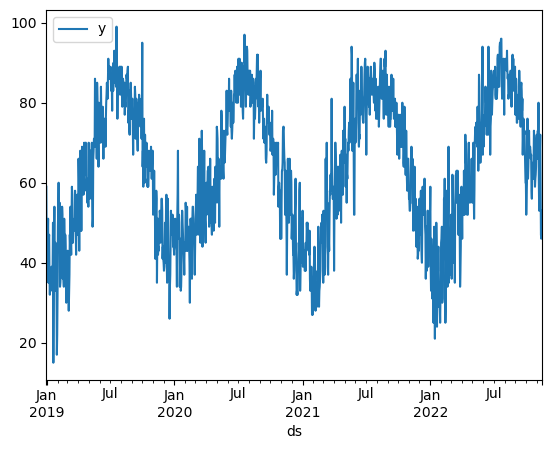

In [42]:
weather["2018-12-31":].plot("ds", "y")

We can see there is a strong pattern in our daily temperatures. So during the summer which is where the peaks are, our temperature is high and in the bottom, the temperature is low. And this pattern repeats overtime. We can refer it as a seasonal pattern. Prophet separates the temperatures into these different factors like how much the month impacts the temperature, how much the day of the week impacts the temperature, is there a general trend in the temperature seperate from these seasonal facts? And it tries to predict each one separately and then adds them together to get the final prediction. 

In [43]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

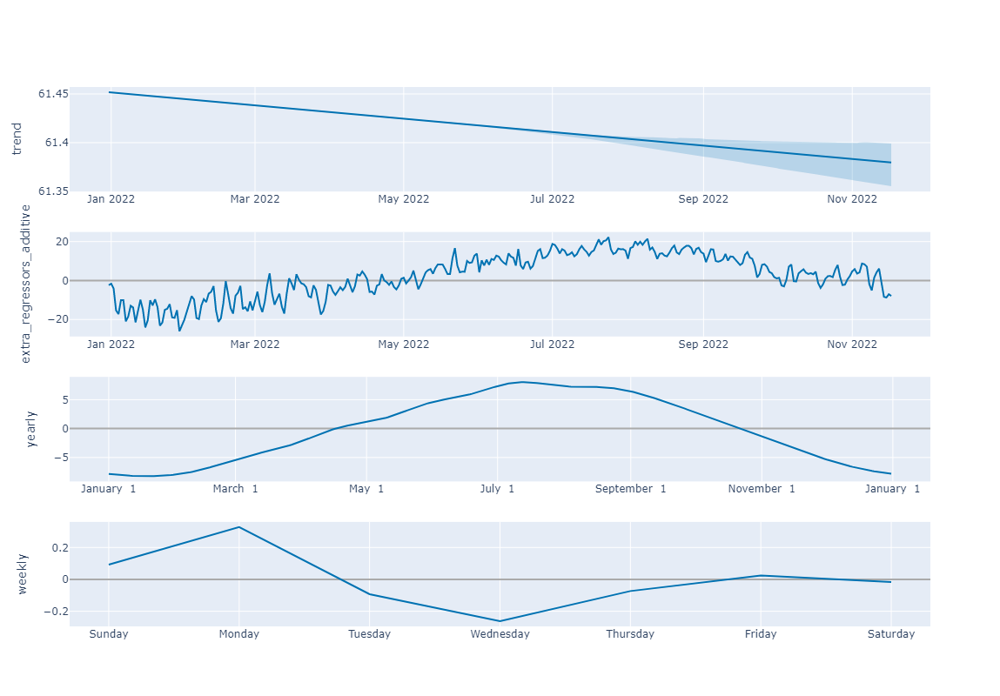

In [44]:
plot_components_plotly(m, predictions)

Now  let's look at how important our columns are to Prophet's predictions

In [45]:
from prophet.utilities import regressor_coefficients

In [46]:
regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp_x,additive,0.118130,-0.195667,-0.195667,-0.195667
1,snow_x,additive,0.064540,-0.011915,-0.011915,-0.011915
2,snwd_x,additive,0.209635,0.063296,0.063296,0.063296
3,tmax_x,additive,61.758648,0.012399,0.012399,0.012399
4,tmin_x,additive,47.494024,-0.083919,-0.083919,-0.083919
5,prcp_y,additive,0.123378,-0.321682,-0.321682,-0.321682
6,snow_y,additive,0.071347,-0.491140,-0.491140,-0.491140
7,snwd_y,additive,0.217759,-0.201450,-0.201450,-0.201450
8,tmax_y,additive,62.609277,0.281497,0.281497,0.281497
9,tmin_y,additive,48.923130,0.427295,0.427295,0.427295


The dataframe above shows the impact of a single regressor on our predictions. For exemple the first row shows us the impact of precipitations at JFK on tomorrow's temperature. And we can see that generally if it rains today, Prophet thinks tomorrow the temperature would be lower (indicated by a negative coefficient)

Now let's look at the mean square error (mse) which is a very common way to measure how effective our model was. 

In [47]:
predictions.index = test.index
predictions["actual"] = test["y"]

In [48]:
def mse(predictions, actual_label="actual", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label])**2)
    print(se.mean())
    
mse(predictions)

40.538174270609524


## Cross validation

If we evaluate our model across our whole dataset using cross validation, we can get a more realistic error estimate. So cross validation splits our data into multiple pieces and then uses the first piece for example to predict the second piece, then put the first and second pieces together and uses it to predict the third piece. What this makes sure is we are not training our model using the same data we're testing it on but we're still able to get a error metric or estimate accross a good portion of the data.

In [49]:
from prophet.diagnostics import cross_validation

In [52]:
m = fit_prophet(weather)
cv = cross_validation(m, initial=f"{365*5} days", period="180 days", horizon="180 days", parallel="processes")

17:53:43 - cmdstanpy - INFO - Chain [1] start processing
17:54:03 - cmdstanpy - INFO - Chain [1] done processing


In [51]:
mse(cv, actual_label="y")

36.179305024625876


Our `error` accross the `whole dataset` is a little bit lower than our `error` of just `2022`. Maybe there was something weird happening in 2022

<AxesSubplot:>

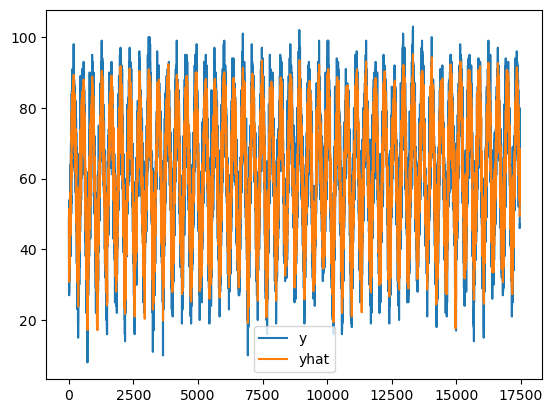

In [54]:
cv[['y', 'yhat'][-365:]].plot()

We can see tjat our predicted `y` values do correlate well and follow the trend pretty well but we can see there's a lot of spikes in the actual temperature that our model doesn't know about. Those spikes could be for a number of reasons. There could be a storm system coming south from Canada into New York. There could be a hurricane. Our model just doesn't have enough information to follow all these spikes. 

## Make Future predictions 

Now lets use our model to predict one day ahead.

In [55]:
m = fit_prophet(weather)
m.predict(weather.iloc[-1:])

18:15:30 - cmdstanpy - INFO - Chain [1] start processing
18:15:52 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-17,61.655414,42.565354,57.827923,61.655414,61.655414,-11.530812,-11.530812,-11.530812,-7.904525,...,-0.065223,-0.065223,-0.065223,-3.561064,-3.561064,-3.561064,0.0,0.0,0.0,50.124602


How about predicting multiple days ahead? Predicting multiple days ahead could be less acurate than predicting a day ahead. Let's predict for the next 365 days.

In [56]:
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)

18:23:25 - cmdstanpy - INFO - Chain [1] start processing
18:23:31 - cmdstanpy - INFO - Chain [1] done processing


In [57]:
future

,ds
0,1970-01-01
1,1970-01-02
2,1970-01-03
3,1970-01-04
4,1970-01-05
...,...
19674,2023-11-13
19675,2023-11-14
19676,2023-11-15
19677,2023-11-16


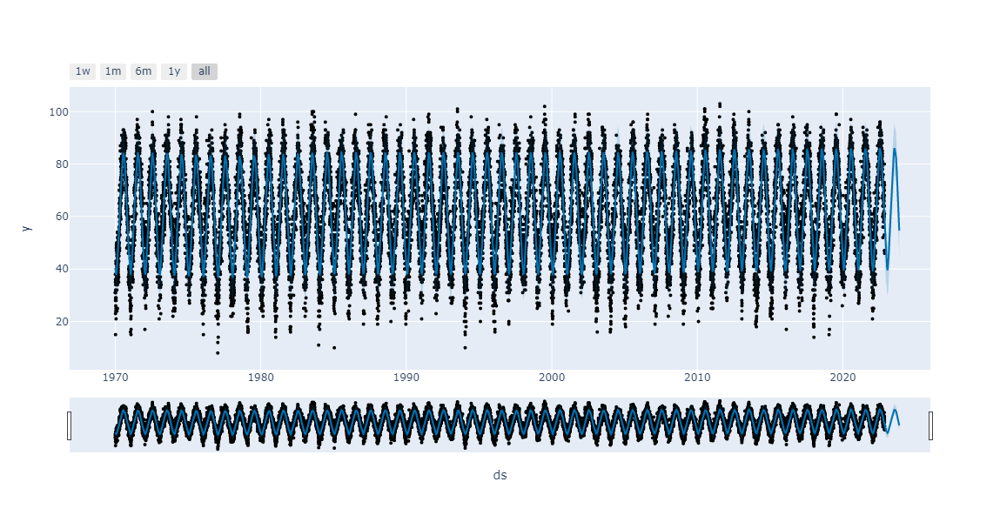

In [58]:
forecast = m.predict(future)
plot_plotly(m, forecast)